# **1.1 Histogram Equalization (Redistributing Pixels)**

In [ ]:
pip install pillow

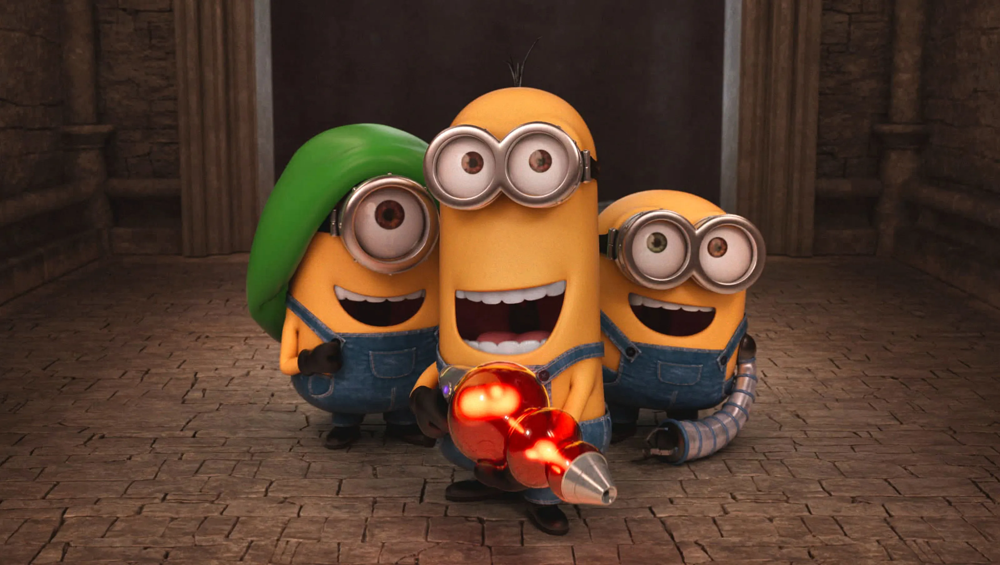

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
# Read Images
img = cv2.imread('minion.jpg')

# Output Images
cv2_imshow(img)

Text(0.5, 1.0, 'Histogram')

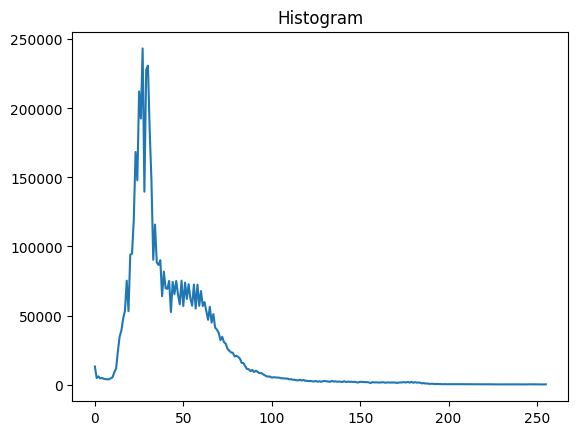

In [ ]:
# a) Calculate the histogram
import numpy as np
import matplotlib.pyplot as plt
hist = cv2.calcHist([img], [0], None, [256], [0, 256])
plt.plot(hist)
plt.title('Histogram')

Text(0.5, 1.0, 'Cumulative Histogram')

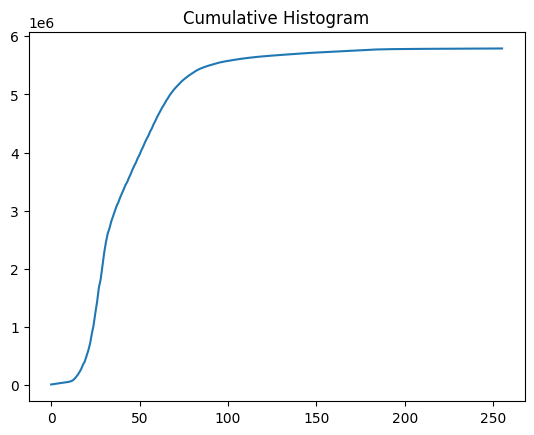

In [ ]:
# b) Calculate Cumulative histogram
cumulative_hist = hist.cumsum()
plt.plot(cumulative_hist)
plt.title('Cumulative Histogram')

Text(0.5, 1.0, 'Normalized Cumulative Histogram')

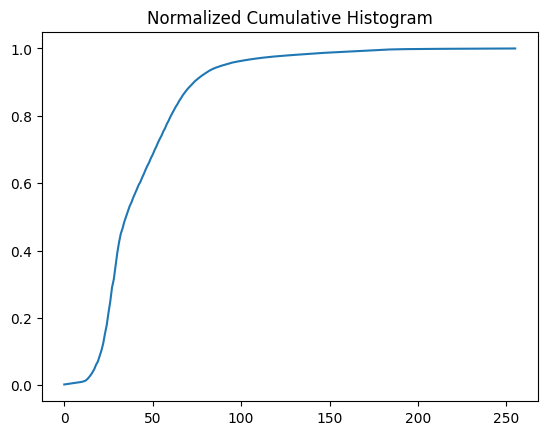

In [ ]:
#c) Normalize Cumulative histogram
normalized_histogram = cumulative_hist / cumulative_hist[-1]
plt.plot(normalized_histogram)
plt.title('Normalized Cumulative Histogram')

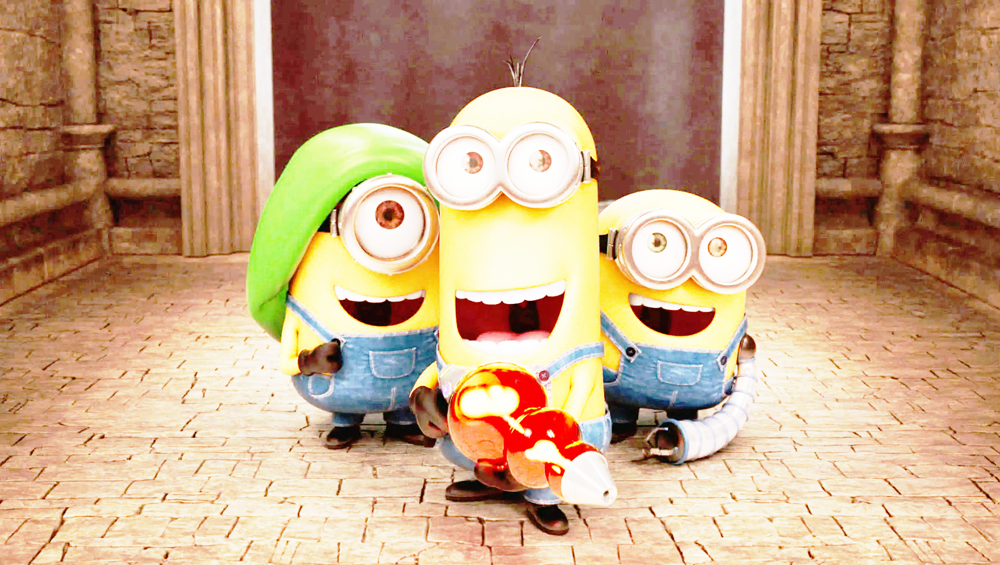

In [ ]:
# d) Apply histogram equalization
equalized_image = np.interp(img.flatten(), np.arange(0, 256), normalized_histogram * 255)
equalized_image = equalized_image.reshape(img.shape).astype(np.uint8)
cv2_imshow(equalized_image)

# **1.2 Convert RGB Image into GrayScale**

Text(0.5, 1.0, 'Grayscale (Formula)')

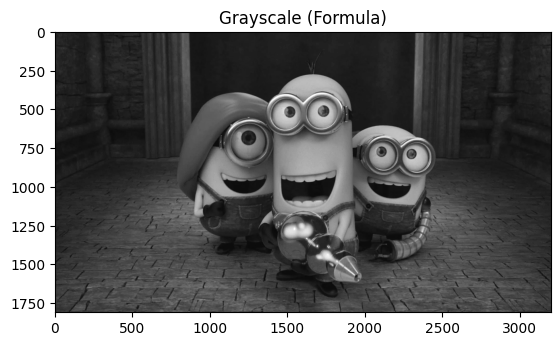

In [ ]:
# 1. Using formula:
# gray_img = 0.299 R + 0.587 G + 0.114 B
gray_formula = 0.299 * img[:, :, 2] + 0.587 * img[:, :, 1] + 0.114 * img[:, :, 0]
plt.imshow(gray_formula, cmap='gray')
plt.title('Grayscale (Formula)')

Text(0.5, 1.0, 'Grayscale (OpenCV)')

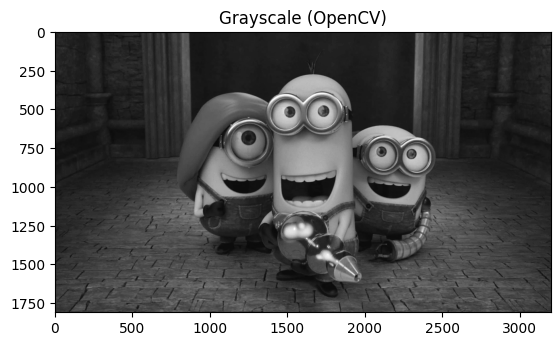

In [ ]:
# 2. Using OpenCv Buitl-In Function:
# cv2.cvtColor()
gray_opencv = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.imshow(gray_opencv, cmap='gray')
plt.title('Grayscale (OpenCV)')

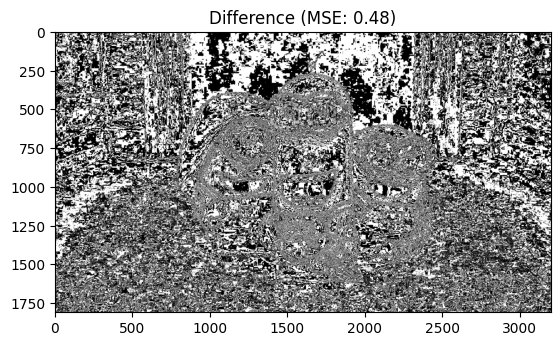

Grayscale images differ.


In [ ]:
# Difference
difference = cv2.absdiff(gray_formula.astype(np.uint8), gray_opencv)
mse = np.sum(difference ** 2) / float(gray_formula.shape[0] * gray_formula.shape[1])

plt.imshow(difference, cmap='gray')
plt.title(f'Difference (MSE: {mse:.2f})')
plt.show()

if mse == 0:
    print("Both grayscale images are identical.")
else:
    print("Grayscale images differ.")

# **1.3 Change Image Resolution**

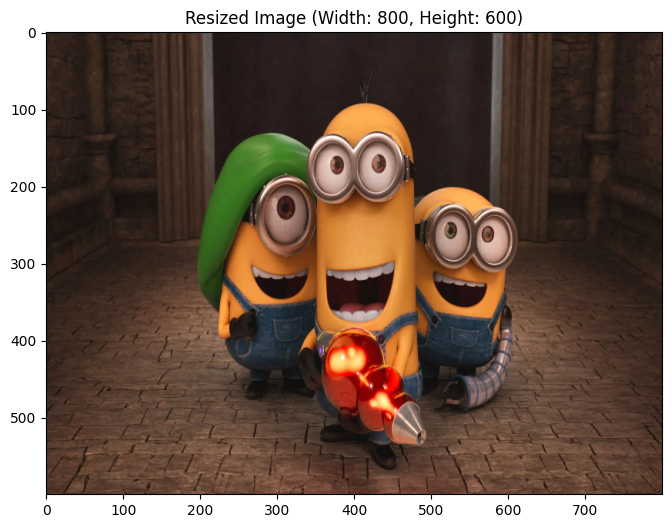

Original Image Dimensions: 3200x1809
Resized Image Dimensions: 800x600
Difference in Width: 2400 pixels
Difference in Height: 1209 pixels


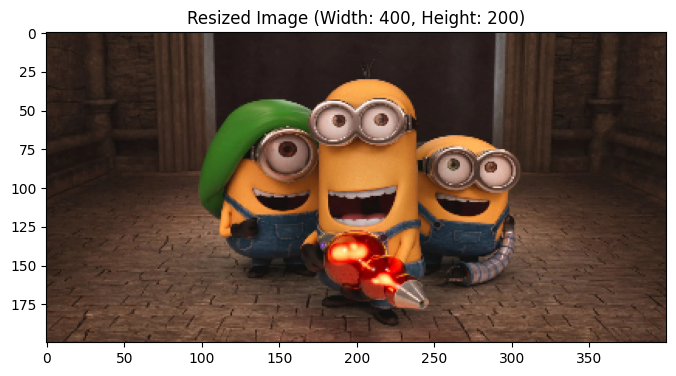

Original Image Dimensions: 3200x1809
Resized Image Dimensions: 400x200
Difference in Width: 2800 pixels
Difference in Height: 1609 pixels


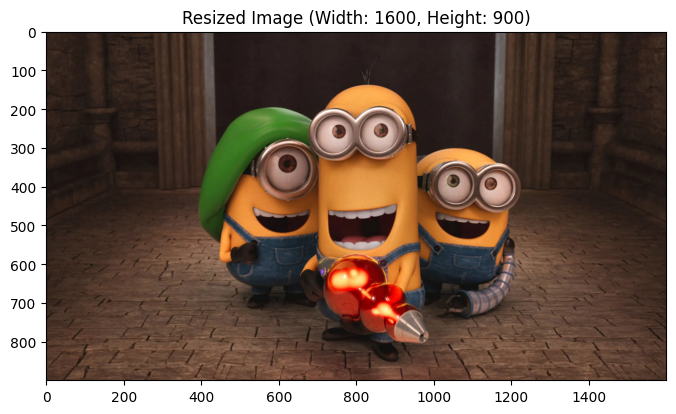

Original Image Dimensions: 3200x1809
Resized Image Dimensions: 1600x900
Difference in Width: 1600 pixels
Difference in Height: 909 pixels


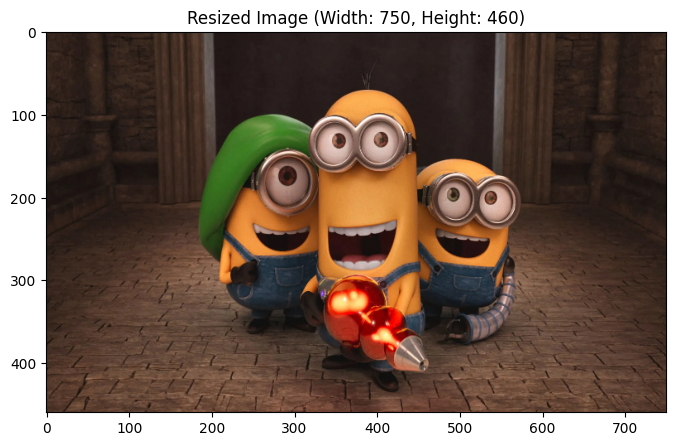

Original Image Dimensions: 3200x1809
Resized Image Dimensions: 750x460
Difference in Width: 2450 pixels
Difference in Height: 1349 pixels


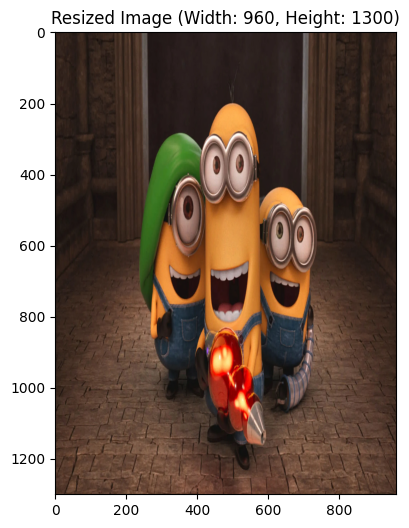

Original Image Dimensions: 3200x1809
Resized Image Dimensions: 960x1300
Difference in Width: 2240 pixels
Difference in Height: 509 pixels


In [ ]:
original_height, original_width = img.shape[:2]

# List of target resolutions
target_resolutions = [(800, 600), (400, 200), (1600, 900), (750, 460), (960, 1300)]

for target_width, target_height in target_resolutions:
    # Calculate scale factors for resizing
    scale_x = target_width / original_width
    scale_y = target_height / original_height

    # Resize image using interpolation
    resized_image = cv2.resize(img, (target_width, target_height), interpolation=cv2.INTER_LINEAR)

    # Display resized image
    plt.figure(figsize=(8, 6))
    plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
    plt.title(f'Resized Image (Width: {target_width}, Height: {target_height})')
    plt.show()

    # Calculate and display the difference in resolutions
    width_difference = abs(target_width - original_width)
    height_difference = abs(target_height - original_height)
    print(f"Original Image Dimensions: {original_width}x{original_height}")
    print(f"Resized Image Dimensions: {target_width}x{target_height}")
    print(f"Difference in Width: {width_difference} pixels")
    print(f"Difference in Height: {height_difference} pixels")
    print("=" * 40)

# **1.4 Apply Convolution techniques**

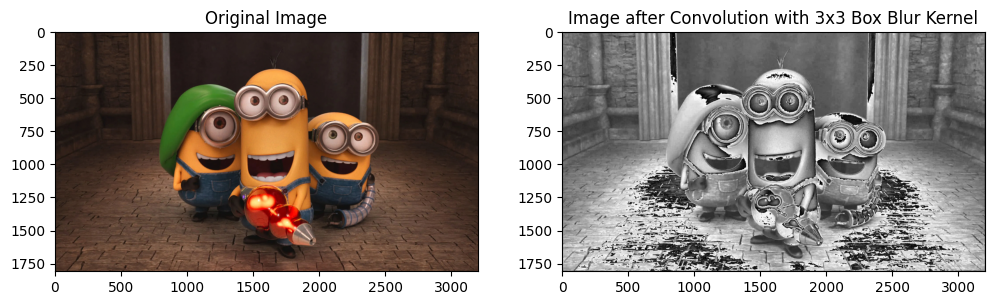

In [ ]:
# Create a 3x3 Box Blur Kernel
kernel = np.ones((3, 3), np.float32) / 9

#Import Image

image = cv2.imread('minion.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Get dimensions of image and kernel
image_height, image_width, _ = image.shape
kernel_height, kernel_width = kernel.shape

# Create a Dummy Image
dummy_image = np.zeros_like(image)

# Convolve the kernel with the image
for i in range(1, image_height - 1):
    for j in range(1, image_width - 1):
        # Calculate the coordinates
        region = image[i-1:i+2, j-1:j+2]

        # Compute resultant pixel
        dummy_image[i, j] = np.sum(region * kernel)

# Display the original and convolved images
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(dummy_image.astype(np.uint8))
plt.title('Image after Convolution with 3x3 Box Blur Kernel')

plt.show()

# **1.5 Apply Correltion techniques**

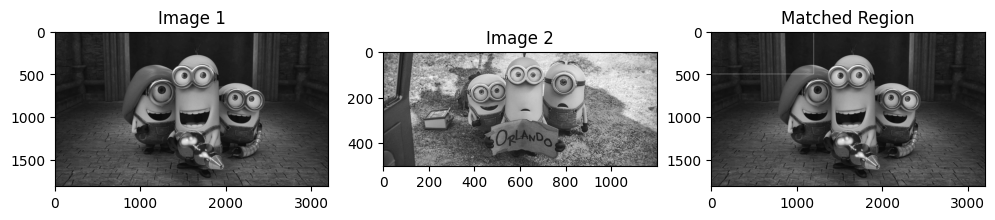

Maximum Correlation Value: -1.0


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load two example images (you can use your own images)
image1 = cv2.imread('minion.jpg', 0)  # Load the first image in grayscale
image2 = cv2.imread('minion2.jpg', 0)  # Load the second image in grayscale

# Get the dimensions of the images
height1, width1 = image1.shape
height2, width2 = image2.shape

# Create a dummy image with the same dimensions as image1
dummy_image = np.zeros((height1, width1), dtype=np.float32)

# Normalize the pixel values of the images by 255.0
image1_normalized = image1 / 255.0
image2_normalized = image2 / 255.0

# Perform cross-correlation manually
max_correlation_value = -1.0  # Initialize with a minimum value
match_location = (0, 0)

for y in range(height1 - height2 + 1):
    for x in range(width1 - width2 + 1):
        roi = image1_normalized[y:y+height2, x:x+width2]
        correlation = np.sum(roi * image2_normalized)
        if correlation > max_correlation_value:
            max_correlation_value = correlation
            match_location = (x, y)

# Show the matched region along with the two images
plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.imshow(image1, cmap='gray')
plt.title('Image 1')

plt.subplot(1, 3, 2)
plt.imshow(image2, cmap='gray')
plt.title('Image 2')

plt.subplot(1, 3, 3)
result_image = image1.copy()
cv2.rectangle(result_image, match_location, (match_location[0] + width2, match_location[1] + height2), 255, 2)
plt.imshow(result_image, cmap='gray')
plt.title('Matched Region')
plt.show()

print(f"Maximum Correlation Value: {max_correlation_value}")